In [2]:
import ipdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pylab
import cartopy
import cartopy.crs as ccrs
from utils import constants as cnst
from eod import msg
from utils import u_grid, u_interpolate as u_int, u_darrays as uda
import datetime
import salem
from salem import get_demo_file, DataLevels, GoogleVisibleMap, Map
import shapely.geometry as shpg


pylab.rcParams['figure.figsize'] = (50., 50.)
%matplotlib inline

In [1]:
cd ..

/home/ck/pythonWorkspace/proj_CEH


/home/ck/miniconda3/lib/python3.7/site-packages/descartes/patch.py:87: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  return PathPatch(PolygonPath(polygon), **kwargs)


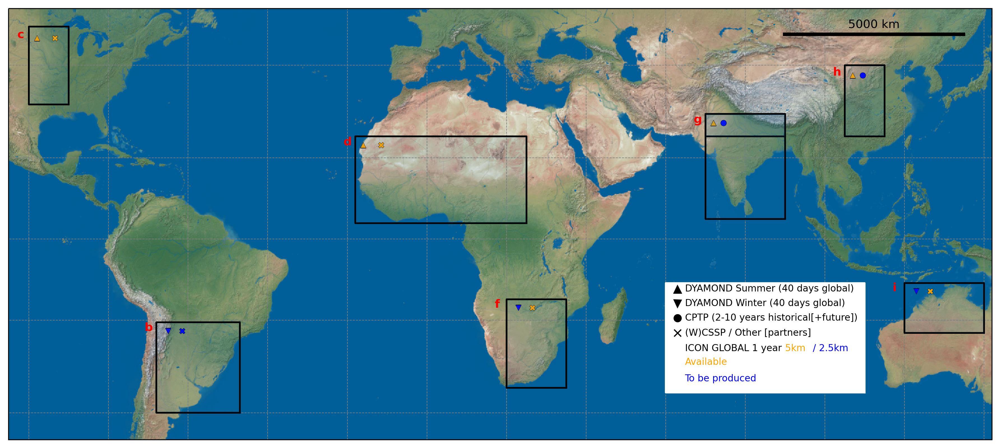

In [58]:
regions = {
    'india' : ([70,90, 5,30], 'k', 'solid', 0.8, ("^", 'orange'), ("", 'b') , ("o", 'b'), ("", 'orange'), 'g', '', 'india'),
    'india_cptp' : ([70,90, 25,30], 'k', 'solid', 0.8, ("^", 'orange'), ("", 'b') , ("o", 'b'), ("", 'orange'), '', 'fu', 'Northern India'),
    #'cptp' : ([70,115,25,40], 'blue', 'dashed', 2, ('o', 'k')),
    'china' : ([105,115,25,40], 'k', 'solid', 0.8, ("^", 'orange') , ("", 'b') , ("o", 'b'), ("", 'orange'), 'h', 'fu', 'china'),
    'australia' : ([120,140,-23, -11], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') , ("", 'b'), ("X", 'orange'), 'i', '', 'australia'),
    'sa' : ([20,35, -35,-15], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b'),  ("", 'b'), ("X", 'orange'), 'f' , 'fu', 'SAf'),
#     'sub_ssa_p' : ([-68,-47, -40, -20.5], 'purple', 'solid', 1.5, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'e', 'fu'),
#     'trop_ssa_p' : ([-75, -50, -20, -5], 'purple', 'solid', 1.5, ('', 'orange'), ("v", 'b'), ("", 'b') , ("X", 'orange'), 'd', 'fu'),
    'sub_ssa' : ([-68,-47, -40, -20.5], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'b', 'fu', 'sub_SA'),
   # 'trop_ssa' : ([-75, -50, -20, -5], 'k', 'solid', 0.8, ('', 'orange'), ("v", 'b'), ("", 'b') , ("X", 'orange'), 'a', 'fu', 'Tropical South America'),
    'sahel' : ([-18,25,4,25], 'k', 'solid', 0.8, ("^", 'orange'), ("", 'b'), ("", 'b') , ("X", 'orange'), 'd', 'fu', 'WAf'),
    'GPlains' : ([-100,-90,32,47], 'k', 'solid', 0.8, ("^", 'orange'), ("", 'b'), ("", 'b') , ("X", 'orange'), 'c', 'fu', 'GPlains'),
  #  'congo' : ([9, 35, -10, 9], 'k', 'solid', 0.8, ("^", 'orange'), ("", 'b'), ("v", 'b') , ("", 'orange'), 'e', 'fu', 'Central Africa')
    }

f = plt.figure(figsize=(12, 6), dpi=300)
ax = f.add_subplot(1, 1, 1, projection=ccrs.Robinson())

# get the map from a predefined grid
grid = salem.mercator_grid(transverse=False, center_ll=(16., 0.),
                           extent=(8e6, 9e6))
smap = salem.Map(grid)

# Add the background (other resolutions include: 'mr', 'hr')

sm = Map(g.grid, factor=1)
sm.set_rgb(natural_earth='lr')
# Change the country borders
sm.set_shapefile()
sm.set_shapefile(countries=True, color='grey', linewidths=0.05)

# Change the lon-lat countour setting
sm.set_lonlat_contours()
sm.set_lonlat_contours( interval=20, linewidths=0.5,
                         linestyles='dashed', colors='grey')


sm.set_scale_bar(location=(0.88, 0.94))  # add scale

for reg in regions.keys():
        #sm.set_geometry()
        coord = (regions[reg])[0]
        #ipdb.set_trace()
        geom = shpg.box(coord[0], coord[2], coord[1], coord[3])
        if (reg == 'india_cptp') | (reg=='china'):
            edc = 'k'
        else:
            edc = (regions[reg])[1]
        sm.set_geometry(geom, zorder=99, facecolor=None,edgecolor=edc, linewidth=(regions[reg])[3], linestyle=(regions[reg])[2], alpha=0.1) 
        
        x, y = sm.grid.transform(coord[0]-3, coord[3]-2)
        plt.text(x,y,(regions[reg])[8], fontweight='bold', color='red')

        points = (regions[reg])[4]
        x, y = sm.grid.transform(coord[0]+2, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
        points = (regions[reg])[5]
        x, y = sm.grid.transform(coord[0]+3, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
        points = (regions[reg])[6]
        x, y = sm.grid.transform(coord[0]+4.5, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
        points = (regions[reg])[7]
        x, y = sm.grid.transform(coord[0]+6.5, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)

   
boxed = shpg.box(60, -36, 110, -11)
sm.set_geometry(boxed, facecolor='white',edgecolor='white', color='white', fill=True, zorder=98)
        
lon,lat = 63, -12.5
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='^', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'DYAMOND Summer (40 days global)', fontsize=8, zorder=99)

lon,lat = 63, -16
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='v', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'DYAMOND Winter (40 days global)', fontsize=8, zorder=99)

lon,lat = 63, -19.5
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='o', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'CPTP (2-10 years historical[+future])', fontsize=8, zorder=99)

lon,lat = 63, -23
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, '(W)CSSP / Other [partners]', fontsize=8, zorder=99)


lon,lat = 63, -26.5
x, y = sm.grid.transform(lon, lat)
#plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'ICON GLOBAL 1 year', fontsize=8, zorder=99, color='k')
plt.text(x+145, y-2.5, '5km ', fontsize=8, zorder=99, color='orange')
plt.text(x+185, y-2.5, '/ 2.5km', fontsize=8, zorder=99, color='b')


lon,lat = 63, -29.5
x, y = sm.grid.transform(lon, lat)
#plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'Available', fontsize=8, zorder=99, color='orange')

lon,lat = 63, -33
x, y = sm.grid.transform(lon, lat)
#plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'To be produced', fontsize=8, zorder=99, color='b')


sm.visualize()  # plot it
plt.tight_layout()
#f.savefig('/home/ck/OneDrive/data/CEH/proposals/MCS_global_proposal/regions_plot_'+tag+'.jpg')
f.savefig('/home/ck/DIR/cornkle/figs/GLOBAL_MCS/regions_plot_'+tag+'_carto.png')

In [36]:
tag = 'satellite'
g = GoogleVisibleMap(x=[-90, 140], y=[-40, 30], #[-80, 140], y=[-40, 30]
                     scale=4,  # scale is for more details
                     maptype=tag)  # try out also: 'terrain'

Text(0.5, 1.0, 'Google static map')

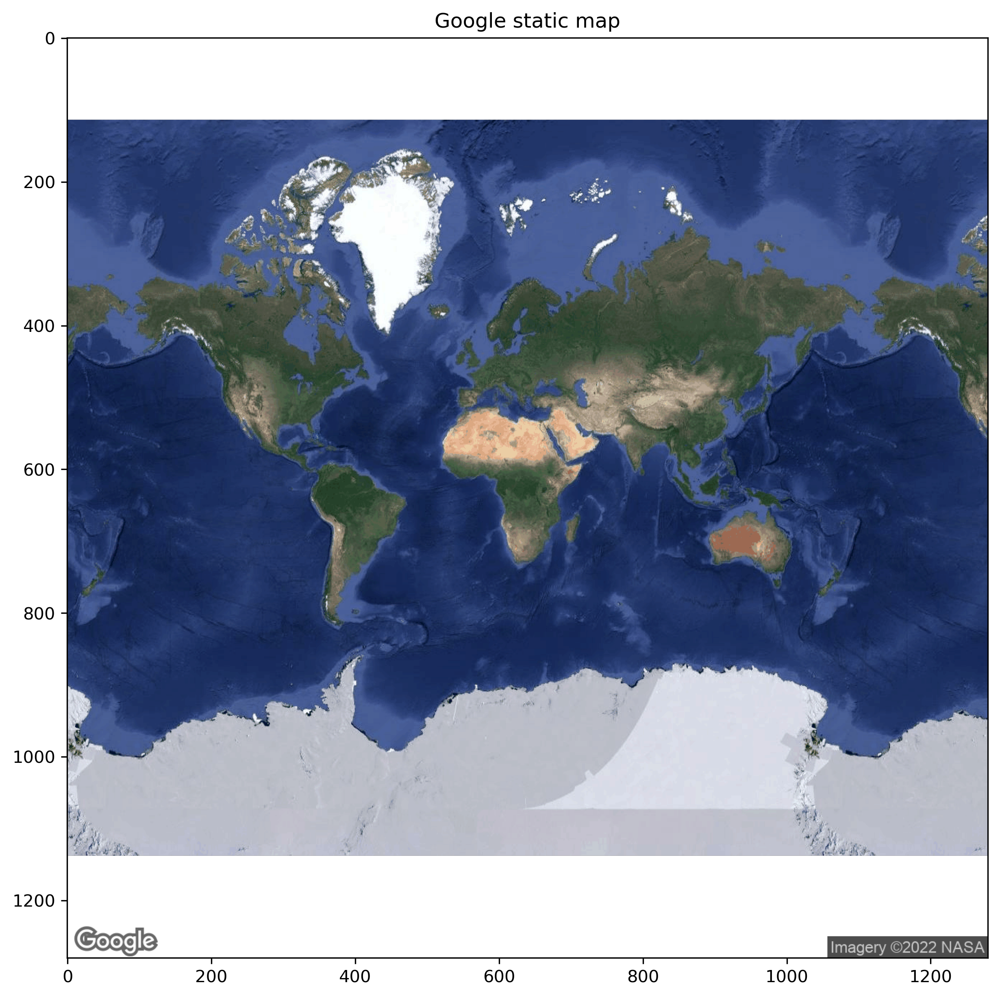

In [37]:
f = plt.figure(figsize=(15,10), dpi=300)
ax1 = f.add_subplot(111)
# the google static image is a standard rgb image
ggl_img = g.get_vardata()
ax1.imshow(ggl_img)

ax1.set_title('Google static map')


In [38]:
g.set_subset(corners=[(-105,-45),(142,50)])
ggl_img = g.get_vardata()

In [39]:
g.grid

<salem.Grid>
  proj: +a=6378137 +b=6378137 +k=1 +lat_ts=0 +lon_0=0 +nadgrids=@null +no_defs+proj=merc +units=m +wktext +x_0=0 +y_0=0
  pixel_ref: center
  origin: upper-left
  (nx, ny): (1406, 617)
  (dx, dy): (19567.87924100512, -19567.87924100512)
  (x0, y0): (-11697243.36851195, 6447995.51100526)

ValueError: Dimensions of data do not match the map.

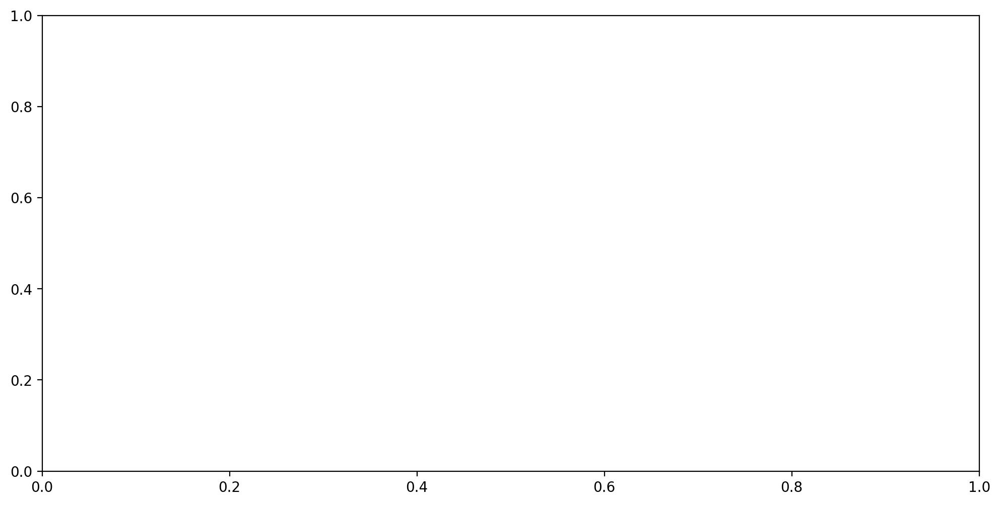

In [40]:
regions = {
    'india' : ([70,90, 5,30], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), 'g', '', 'india'),
    'india_cptp' : ([70,90, 25,30], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), '', 'fu', 'Northern India'),
    #'cptp' : ([70,115,25,40], 'blue', 'dashed', 2, ('o', 'k')),
    'china' : ([105,115,25,40], 'k', 'solid', 0.8, ("^", 'g') , ("", 'b') , ("o", 'b'), ("", 'g'), 'h', 'fu', 'china'),
    'australia' : ([120,140,-23, -11], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') , ("", 'b'), ("X", 'g'), 'i', '', 'australia'),
    'sa' : ([20,35, -35,-15], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b'),  ("", 'b'), ("P", 'g'), 'f' , 'fu', 'SAf'),
#     'sub_ssa_p' : ([-68,-47, -40, -20.5], 'purple', 'solid', 1.5, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'e', 'fu'),
#     'trop_ssa_p' : ([-75, -50, -20, -5], 'purple', 'solid', 1.5, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'd', 'fu'),
    'sub_ssa' : ([-68,-47, -40, -20.5], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'b', 'fu', 'sub_SA'),
   # 'trop_ssa' : ([-75, -50, -20, -5], 'k', 'solid', 0.8, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'a', 'fu', 'Tropical South America'),
    'sahel' : ([-18,25,4,25], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("P", 'g'), 'd', 'fu', 'WAf'),
    'GPlains' : ([-100,-90,32,47], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("X", 'g'), 'c', 'fu', 'GPlains'),
  #  'congo' : ([9, 35, -10, 9], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("v", 'b') , ("", 'g'), 'e', 'fu', 'Central Africa')
    }


f = plt.figure(figsize=(12,6), dpi=200)
ax1 = f.add_subplot(111)
# make a map of the same size as the image (no country borders)



sm = Map(g.grid, factor=1)
# Change the country borders
sm.set_shapefile()
sm.set_shapefile(countries=True, color='grey', linewidths=0.05)

# Change the lon-lat countour setting
sm.set_lonlat_contours()
sm.set_lonlat_contours( interval=20, linewidths=0.5,
                         linestyles='dashed', colors='grey')

sm.set_rgb(ggl_img)  # add the background rgb image
sm.set_scale_bar(location=(0.88, 0.94))  # add scale
if tag == 'terrain':
    ec = 'k'
else:
    ec = 'w'
for reg in regions.keys():
        #sm.set_geometry()
        coord = (regions[reg])[0]
        #ipdb.set_trace()
        geom = shpg.box(coord[0], coord[2], coord[1], coord[3])
        if (reg == 'india_cptp') | (reg=='china'):
            edc = 'orange'
        else:
            edc = (regions[reg])[1]
        sm.set_geometry(geom, zorder=99, facecolor=None,edgecolor=edc, linewidth=(regions[reg])[3], linestyle=(regions[reg])[2], alpha=0.1) 
        
        x, y = sm.grid.transform(coord[0]-3, coord[3]-2)
        plt.text(x,y,(regions[reg])[8], fontweight='bold', color='red')

        points = (regions[reg])[4]
        x, y = sm.grid.transform(coord[0]+2, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
        points = (regions[reg])[5]
        x, y = sm.grid.transform(coord[0]+3, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
        points = (regions[reg])[6]
        x, y = sm.grid.transform(coord[0]+4.5, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
        points = (regions[reg])[7]
        x, y = sm.grid.transform(coord[0]+6.5, coord[3]-2)
        plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)

   
boxed = shpg.box(60, -36, 110, -11)
sm.set_geometry(boxed, facecolor='white',edgecolor='white', color='white', fill=True, zorder=98)
        
lon,lat = 63, -12.5
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='^', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'DYAMOND Summer (40 days global)', fontsize=7, zorder=99)

lon,lat = 63, -16
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='v', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'DYAMOND Winter (40 days global)', fontsize=7, zorder=99)

lon,lat = 63, -19.5
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='o', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'CPTP (2-10 years historical[+future])', fontsize=7, zorder=99)

lon,lat = 63, -23
x, y = sm.grid.transform(lon, lat)
plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, '(W)CSSP / Other [partners]', fontsize=7, zorder=99)


lon,lat = 63, -26.5
x, y = sm.grid.transform(lon, lat)
#plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'ICON GLOBAL - 5km/1year', fontsize=7, zorder=99, color='k')


lon,lat = 63, -29.5
x, y = sm.grid.transform(lon, lat)
#plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'Available', fontsize=7, zorder=99, color='g')

lon,lat = 63, -33
x, y = sm.grid.transform(lon, lat)
#plt.plot(x,y,color='k', marker='x', zorder=99)
x, y = sm.grid.transform(lon+1.5, lat-1)
plt.text(x+2, y-2.5, 'To be produced', fontsize=7, zorder=99, color='b')


sm.visualize()  # plot it
plt.tight_layout()
#f.savefig('/home/ck/OneDrive/data/CEH/proposals/MCS_global_proposal/regions_plot_'+tag+'.jpg')
f.savefig('/home/ck/DIR/cornkle/figs/GLOBAL_MCS/regions_plot_'+tag+'.jpg')

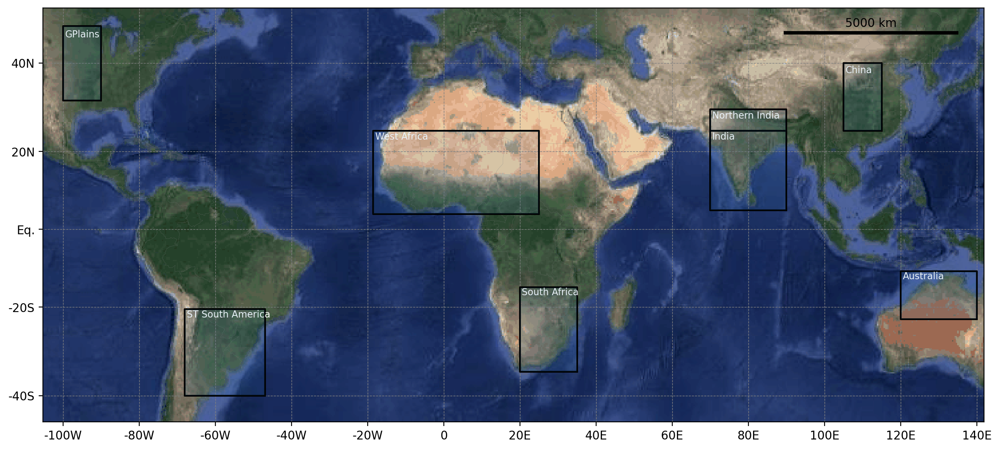

In [30]:
regions = {
    'india' : ([70,90, 5,25], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), 'g', '', 'India'),
    'india_cptp' : ([70,90, 25,30], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), '', 'fu', 'Northern India'),
    #'cptp' : ([70,115,25,40], 'blue', 'dashed', 2, ('o', 'k')),
    'china' : ([105,115,25,40], 'k', 'solid', 0.8, ("^", 'g') , ("", 'b') , ("o", 'b'), ("", 'g'), 'h', 'fu', 'China'),
    'australia' : ([120,140,-23, -11], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') , ("", 'b'), ("", 'g'), 'i', '', 'Australia'),
    'sa' : ([20,35, -35,-15], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b'),  ("", 'b'), ("P", 'g'), 'f' , 'fu', 'South Africa'),
    'GPlains' : ([-100,-90,32,47], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("X", 'g'), 'c', 'fu', 'GPlains'), 
#     'sub_ssa_p' : ([-68,-47, -40, -20.5], 'purple', 'solid', 1.5, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'e', 'fu'),
#     'trop_ssa_p' : ([-75, -50, -20, -5], 'purple', 'solid', 1.5, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'd', 'fu'),
    'sub_ssa' : ([-68,-47, -40, -20.5], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'b', 'fu', 'ST South America'),
   # 'trop_ssa' : ([-79, -50, -20, -5], 'k', 'solid', 0.8, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'a', 'fu', 'Tropical South America'),
    'sahel' : ([-18.5, 25, 4, 25], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("P", 'g'), 'd', 'fu', 'West Africa'),
   # 'alps' : ([2, 15, 42.8, 48.8], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("X", 'g'), 'c', 'fu', 'Alps'),
   # 'congo' : ([9, 35, -10, 9], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("v", 'b') , ("", 'g'), 'e', 'fu', 'Central Africa')
    }


f = plt.figure(figsize=(12,6), dpi=200)
ax1 = f.add_subplot(111)
# make a map of the same size as the image (no country borders)



sm = Map(g.grid, factor=1)
# Change the country borders
sm.set_shapefile()
sm.set_shapefile(countries=True, color='grey', linewidths=0.05)

# Change the lon-lat countour setting
sm.set_lonlat_contours()
sm.set_lonlat_contours( interval=20, linewidths=0.5,
                         linestyles='dashed', colors='grey')

sm.set_rgb(ggl_img)  # add the background rgb image
sm.set_scale_bar(location=(0.88, 0.94))  # add scale
if tag == 'terrain':
    ec = 'k'
else:
    ec = 'w'
for reg in regions.keys():
        #sm.set_geometry()
        coord = (regions[reg])[0]
        #ipdb.set_trace()
        geom = shpg.box(coord[0], coord[2], coord[1], coord[3])

        edc = (regions[reg])[1]
            
            
        futag = (regions[reg])[9]
        if futag=='fu':
            ec = 'w'
        else:
            ec = 'w'
        sm.set_geometry(geom, zorder=99, facecolor=None,edgecolor=edc, linewidth=(regions[reg])[3], linestyle=(regions[reg])[2], alpha=0.1) 
        
        x, y = sm.grid.transform(coord[0]+0.5, coord[3]-2)
        plt.text(x,y,(regions[reg])[10],  color='white', fontsize=8) #fontweight='bold',
        

sm.visualize()  # plot it
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/GLOBAL_MCS/regions_plot_'+tag+'_names.jpg')

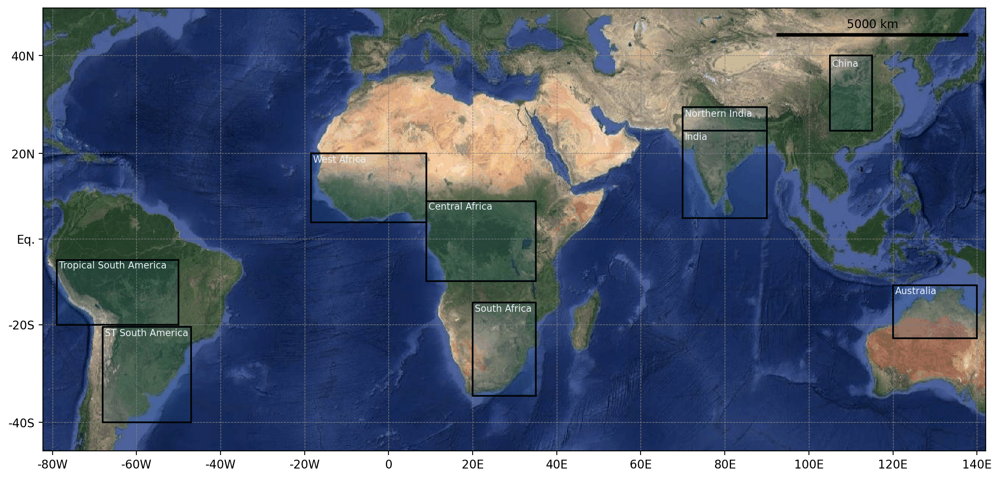

In [19]:
regions = {
    'india' : ([70,90, 5,25], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), 'g', '', 'India'),
    'india_cptp' : ([70,90, 25,30], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), '', 'fu', 'Northern India'),
    #'cptp' : ([70,115,25,40], 'blue', 'dashed', 2, ('o', 'k')),
    'china' : ([105,115,25,40], 'k', 'solid', 0.8, ("^", 'g') , ("", 'b') , ("o", 'b'), ("", 'g'), 'h', 'fu', 'China'),
    'australia' : ([120,140,-23, -11], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') , ("", 'b'), ("", 'g'), 'i', '', 'Australia'),
    'sa' : ([20,35, -35,-15], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b'),  ("", 'b'), ("P", 'g'), 'f' , 'fu', 'South Africa'),
#     'sub_ssa_p' : ([-68,-47, -40, -20.5], 'purple', 'solid', 1.5, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'e', 'fu'),
#     'trop_ssa_p' : ([-75, -50, -20, -5], 'purple', 'solid', 1.5, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'd', 'fu'),
    'sub_ssa' : ([-68,-47, -40, -20.5], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'b', 'fu', 'ST South America'),
    'trop_ssa' : ([-79, -50, -20, -5], 'k', 'solid', 0.8, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'a', 'fu', 'Tropical South America'),
    'sahel' : ([-18.5, 9, 4, 20], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("P", 'g'), 'd', 'fu', 'West Africa'),
   # 'alps' : ([2, 15, 42.8, 48.8], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("X", 'g'), 'c', 'fu', 'Alps'),
    'congo' : ([9, 35, -10, 9], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("v", 'b') , ("", 'g'), 'e', 'fu', 'Central Africa')
    }


f = plt.figure(figsize=(12,6), dpi=200)
ax1 = f.add_subplot(111)
# make a map of the same size as the image (no country borders)



sm = Map(g.grid, factor=1)
# Change the country borders
sm.set_shapefile()
sm.set_shapefile(countries=True, color='grey', linewidths=0.05)

# Change the lon-lat countour setting
sm.set_lonlat_contours()
sm.set_lonlat_contours( interval=20, linewidths=0.5,
                         linestyles='dashed', colors='grey')

sm.set_rgb(ggl_img)  # add the background rgb image
sm.set_scale_bar(location=(0.88, 0.94))  # add scale
if tag == 'terrain':
    ec = 'k'
else:
    ec = 'w'
for reg in regions.keys():
        #sm.set_geometry()
        coord = (regions[reg])[0]
        #ipdb.set_trace()
        geom = shpg.box(coord[0], coord[2], coord[1], coord[3])
#         if (reg == 'india_cptp') | (reg=='china'):
#             edc = 'orange'
#         else:
        edc = (regions[reg])[1]
            
            
        futag = (regions[reg])[9]
        if futag=='fu':
            ec = 'w'
        else:
            ec = 'w'
        sm.set_geometry(geom, zorder=99, facecolor=None,edgecolor=edc, linewidth=(regions[reg])[3], linestyle=(regions[reg])[2], alpha=0.1) 
        
        x, y = sm.grid.transform(coord[0]+0.5, coord[3]-2)
        plt.text(x,y,(regions[reg])[10],  color='white', fontsize=8) #fontweight='bold',

#         points = (regions[reg])[4]
#         x, y = sm.grid.transform(coord[0]+2, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
#         points = (regions[reg])[5]
#         x, y = sm.grid.transform(coord[0]+3, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
#         points = (regions[reg])[6]
#         x, y = sm.grid.transform(coord[0]+4.5, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
#         points = (regions[reg])[7]
#         x, y = sm.grid.transform(coord[0]+6.5, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)

   
# boxed = shpg.box(60, -35, 102, -11)
# sm.set_geometry(boxed, facecolor='white',edgecolor='white', color='white', fill=True, zorder=98)
        
# lon,lat = 63, -12.5
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='^', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'DYAMOND Summer (40 days global)', fontsize=7, zorder=99)

# lon,lat = 63, -16
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='v', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'DYAMOND Winter (40 days global)', fontsize=7, zorder=99)

# lon,lat = 63, -19.5
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='o', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'CPTP (2-10 years), future planned', fontsize=7, zorder=99, color='orange')

# lon,lat = 63, -23
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'WRF / MAR (IGE,UGA), future planned', fontsize=7, zorder=99)

# lon,lat = 63, -26.5
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='P', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'MetUM CP4, future available', fontsize=7, zorder=99, color='k')

# lon,lat = 63, -30
# x, y = sm.grid.transform(lon, lat)
# #plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'Available', fontsize=7, zorder=99, color='g')

# lon,lat = 63, -33.5
# x, y = sm.grid.transform(lon, lat)
# #plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'To be produced or in production', fontsize=7, zorder=99, color='b')

# lon,lat = 63, -37
# x, y = sm.grid.transform(lon, lat)
# #plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'Future projections planned / available', fontsize=7, zorder=99, color='orange')


sm.visualize()  # plot it
plt.tight_layout()
f.savefig('/media/ck/Elements/CNRS/presentation/CNRS/CNRS_regions_plot_'+tag+'.jpg')

In [37]:
tag = 'satellite'
g = GoogleVisibleMap(x=[-90, 140], y=[-40, 30], #[-80, 140], y=[-40, 30]
                     scale=2,  # scale is for more details
                     maptype=tag)  # try out also: 'terrain'

Text(0.5, 1.0, 'Google static map')

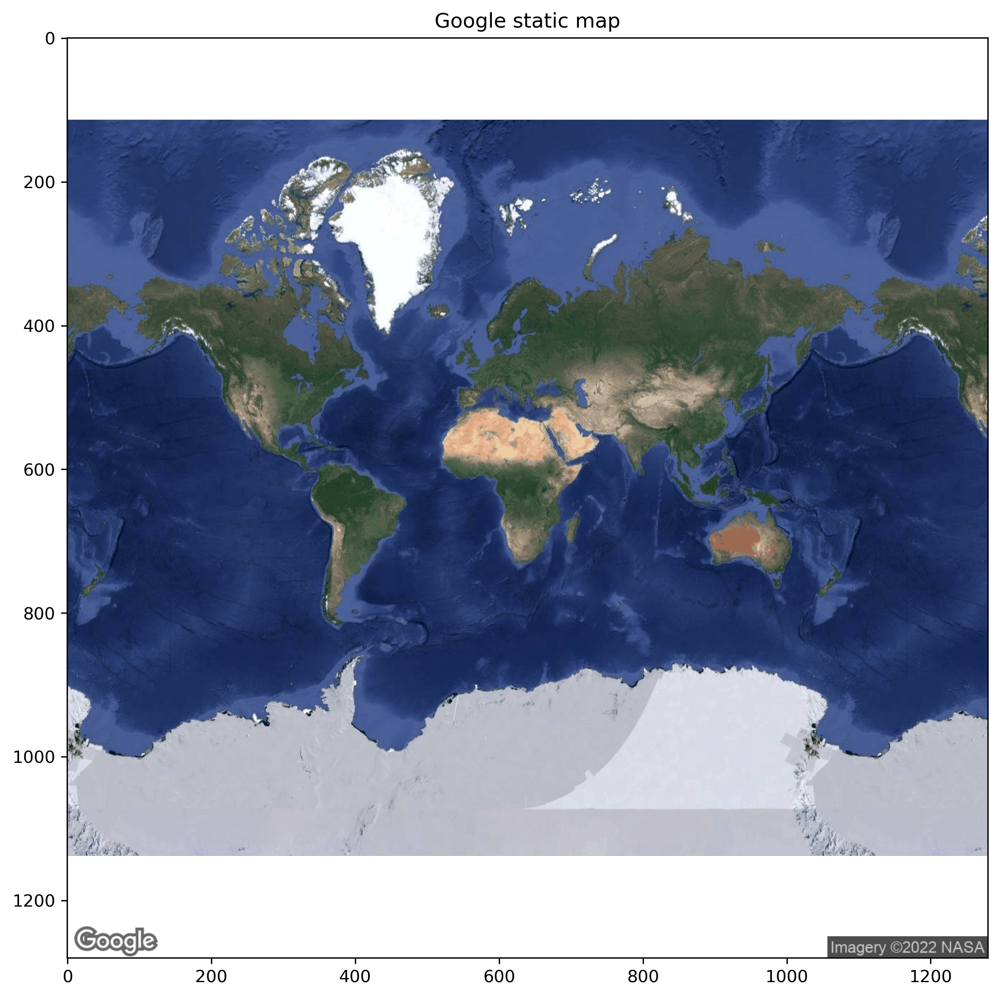

In [38]:
f = plt.figure(figsize=(15,10), dpi=300)
ax1 = f.add_subplot(111)
# the google static image is a standard rgb image
ggl_img = g.get_vardata()
ax1.imshow(ggl_img)

ax1.set_title('Google static map')


In [39]:
g.set_subset(corners=[(-105,-45),(142,50)])
ggl_img = g.get_vardata()

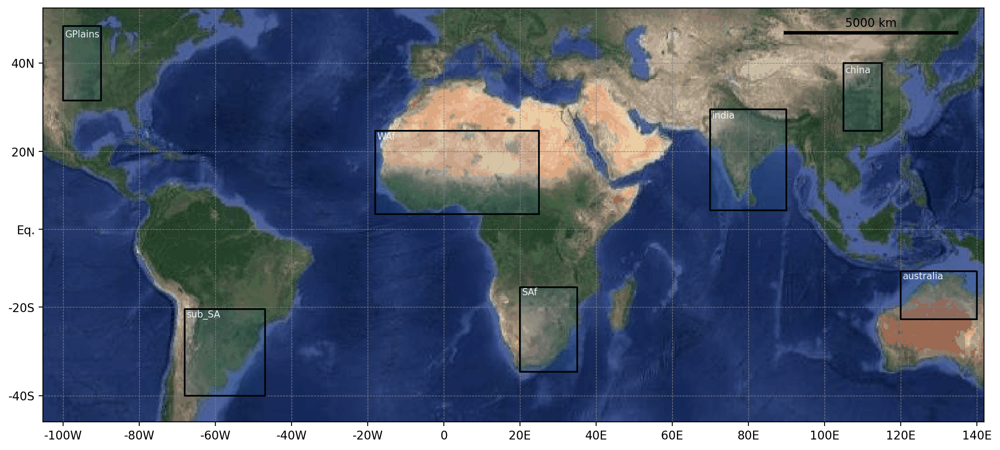

In [41]:
regions = {
    'india' : ([70,90, 5,30], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), 'g', '', 'india'),
    #'india_cptp' : ([70,90, 25,30], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b') , ("o", 'b'), ("", 'g'), '', 'fu', 'Northern India'),
    #'cptp' : ([70,115,25,40], 'blue', 'dashed', 2, ('o', 'k')),
    'china' : ([105,115,25,40], 'k', 'solid', 0.8, ("^", 'g') , ("", 'b') , ("o", 'b'), ("", 'g'), 'h', 'fu', 'china'),
    'australia' : ([120,140,-23, -11], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') , ("", 'b'), ("", 'g'), 'i', '', 'australia'),
    'sa' : ([20,35, -35,-15], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b'),  ("", 'b'), ("P", 'g'), 'f' , 'fu', 'SAf'),
#     'sub_ssa_p' : ([-68,-47, -40, -20.5], 'purple', 'solid', 1.5, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'e', 'fu'),
#     'trop_ssa_p' : ([-75, -50, -20, -5], 'purple', 'solid', 1.5, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'd', 'fu'),
    'sub_ssa' : ([-68,-47, -40, -20.5], 'k', 'solid', 0.8, ('', 'k'), ("v", 'b') ,  ("", 'b'), ("X", 'b'), 'b', 'fu', 'sub_SA'),
   # 'trop_ssa' : ([-75, -50, -20, -5], 'k', 'solid', 0.8, ('', 'g'), ("v", 'b'), ("", 'b') , ("X", 'g'), 'a', 'fu', 'Tropical South America'),
    'sahel' : ([-18,25,4,25], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("P", 'g'), 'd', 'fu', 'WAf'),
    'GPlains' : ([-100,-90,32,47], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("", 'b') , ("X", 'g'), 'c', 'fu', 'GPlains'),
  #  'congo' : ([9, 35, -10, 9], 'k', 'solid', 0.8, ("^", 'g'), ("", 'b'), ("v", 'b') , ("", 'g'), 'e', 'fu', 'Central Africa')
    }


f = plt.figure(figsize=(12,6), dpi=200)
ax1 = f.add_subplot(111)
# make a map of the same size as the image (no country borders)



sm = Map(g.grid, factor=1)
# Change the country borders
sm.set_shapefile()
sm.set_shapefile(countries=True, color='grey', linewidths=0.05)

# Change the lon-lat countour setting
sm.set_lonlat_contours()
sm.set_lonlat_contours( interval=20, linewidths=0.5,
                         linestyles='dashed', colors='grey')

sm.set_rgb(ggl_img)  # add the background rgb image
sm.set_scale_bar(location=(0.88, 0.94))  # add scale
if tag == 'terrain':
    ec = 'k'
else:
    ec = 'w'
for reg in regions.keys():
        #sm.set_geometry()
        coord = (regions[reg])[0]
        #ipdb.set_trace()
        geom = shpg.box(coord[0], coord[2], coord[1], coord[3])
#         if (reg == 'india_cptp') | (reg=='china'):
#             edc = 'orange'
#         else:
        edc = (regions[reg])[1]
            
            
        futag = (regions[reg])[9]
        if futag=='fu':
            ec = 'w'
        else:
            ec = 'w'
        sm.set_geometry(geom, zorder=99, facecolor=None,edgecolor=edc, linewidth=(regions[reg])[3], linestyle=(regions[reg])[2], alpha=0.1) 
        
        x, y = sm.grid.transform(coord[0]+0.5, coord[3]-2)
        plt.text(x,y,(regions[reg])[10],  color='white', fontsize=8) #fontweight='bold',

#         points = (regions[reg])[4]
#         x, y = sm.grid.transform(coord[0]+2, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
#         points = (regions[reg])[5]
#         x, y = sm.grid.transform(coord[0]+3, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
#         points = (regions[reg])[6]
#         x, y = sm.grid.transform(coord[0]+4.5, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)
        
#         points = (regions[reg])[7]
#         x, y = sm.grid.transform(coord[0]+6.5, coord[3]-2)
#         plt.scatter(x, y, color=points[1],marker=points[0], s=25, edgecolor=ec, linewidth=0.2)

   
# boxed = shpg.box(60, -35, 102, -11)
# sm.set_geometry(boxed, facecolor='white',edgecolor='white', color='white', fill=True, zorder=98)
        
# lon,lat = 63, -12.5
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='^', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'DYAMOND Summer (40 days global)', fontsize=7, zorder=99)

# lon,lat = 63, -16
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='v', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'DYAMOND Winter (40 days global)', fontsize=7, zorder=99)

# lon,lat = 63, -19.5
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='o', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'CPTP (2-10 years), future planned', fontsize=7, zorder=99, color='orange')

# lon,lat = 63, -23
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'WRF / MAR (IGE,UGA), future planned', fontsize=7, zorder=99)

# lon,lat = 63, -26.5
# x, y = sm.grid.transform(lon, lat)
# plt.plot(x,y,color='k', marker='P', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'MetUM CP4, future available', fontsize=7, zorder=99, color='k')

# lon,lat = 63, -30
# x, y = sm.grid.transform(lon, lat)
# #plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'Available', fontsize=7, zorder=99, color='g')

# lon,lat = 63, -33.5
# x, y = sm.grid.transform(lon, lat)
# #plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'To be produced or in production', fontsize=7, zorder=99, color='b')

# lon,lat = 63, -37
# x, y = sm.grid.transform(lon, lat)
# #plt.plot(x,y,color='k', marker='x', zorder=99)
# x, y = sm.grid.transform(lon+1.5, lat-1)
# plt.text(x+2, y-2.5, 'Future projections planned / available', fontsize=7, zorder=99, color='orange')


sm.visualize()  # plot it
plt.tight_layout()
f.savefig('/home/ck/DIR/cornkle/figs/GLOBAL_MCS/MCS_regions_plot_'+tag+'.jpg')